# Per-Feature VLM Evaluation Report

Evaluate the **describe-then-classify** VLM pipeline on two morphological features:
- **hymenium_type** (gills, pores, teeth, smooth)
- **cap_color** (white, brown, yellow, orange, red, cream, grey, ...)

**Evaluation levels:**
- **L1** — Per-image accuracy (VLM prediction vs species-level ground truth)
- **L2** — Species consensus (majority vote across images vs GT)
- **Baseline comparison** — Per-feature VLM vs all-at-once VLM sidecars

**Selection:** Species-stratified from joint test split (both features visible).
See `vision/scripts/vlm_eval_run.py` for selection algorithm.

In [1]:
import json
import sys
from collections import Counter
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics import classification_report, confusion_matrix

PROJECT_ROOT = Path.cwd().parents[1]
sys.path.insert(0, str(PROJECT_ROOT))

from db.connection import get_session
from vision.data.ground_truth import load_ground_truth, load_ground_truth_multilabel

EVAL_DIR = PROJECT_ROOT / "data" / "vlm_eval"
VLM_FULL_DIR = PROJECT_ROOT / "data" / "vlm_full" / "run_001"
PROCESSED_DIR = PROJECT_ROOT / "data" / "images" / "processed" / "v1"
FEATURES = ["hymenium_type", "cap_color"]

manifest = pd.read_csv(EVAL_DIR / "eval_manifest.csv")
print(f"Eval manifest: {len(manifest)} images, {manifest['species'].nunique()} species")
for feat in FEATURES:
    print(f"  {feat}: {manifest[feat].nunique()} classes — {dict(manifest[feat].value_counts())}")

Eval manifest: 106 images, 26 species
  hymenium_type: 4 classes — {'gills': np.int64(84), 'pores': np.int64(14), 'teeth': np.int64(5), 'smooth': np.int64(3)}
  cap_color: 7 classes — {'white': np.int64(41), 'brown': np.int64(29), 'yellow': np.int64(13), 'orange': np.int64(7), 'red': np.int64(6), 'cream': np.int64(6), 'grey': np.int64(4)}


In [2]:
# Load ground truth from DB
with get_session() as session:
    gt = {feat: load_ground_truth(session, feat) for feat in FEATURES}
    gt_multilabel = load_ground_truth_multilabel(session, "cap_color")

# Show multi-label GT coverage
n_with_colors = sum(1 for s in gt_multilabel.values() if s)
avg_colors = np.mean([len(s) for s in gt_multilabel.values() if s]) if n_with_colors else 0
print(f"Multi-label GT: {n_with_colors} species with resolved colors, avg {avg_colors:.1f} colors/species")

# Load per-feature VLM predictions from sidecars
feature_fields = {"hymenium_type": "hymenium_type", "cap_color": "cap_color"}
preds = {}  # {feature: {image_id: predicted_value}}
sidecars = {}  # {feature: {image_id: full_sidecar_dict}}

for feat in FEATURES:
    feat_dir = EVAL_DIR / feat
    field = feature_fields[feat]
    preds[feat] = {}
    sidecars[feat] = {}

    for _, row in manifest.iterrows():
        iid = row["image_id"]
        path = feat_dir / f"{iid}.json"
        if not path.exists():
            continue
        try:
            data = json.loads(path.read_text())
            if data.get("error"):
                continue
            preds[feat][iid] = data.get(field)
            sidecars[feat][iid] = data
        except json.JSONDecodeError:
            continue

    print(f"{feat}: {len(preds[feat])} predictions loaded")

# Build per-image labels from species-level GT
image_labels = {}
for feat in FEATURES:
    image_labels[feat] = {}
    for _, row in manifest.iterrows():
        sp_gt = gt[feat].get(row["species"])
        if sp_gt is not None:
            image_labels[feat][row["image_id"]] = sp_gt

    print(f"{feat}: {len(image_labels[feat])} images with ground truth")

2026-04-25 16:14:24,424 INFO sqlalchemy.engine.Engine select pg_catalog.version()


2026-04-25 16:14:24,424 INFO sqlalchemy.engine.Engine [raw sql] {}


2026-04-25 16:14:24,425 INFO sqlalchemy.engine.Engine select current_schema()


2026-04-25 16:14:24,425 INFO sqlalchemy.engine.Engine [raw sql] {}


2026-04-25 16:14:24,427 INFO sqlalchemy.engine.Engine show standard_conforming_strings


2026-04-25 16:14:24,427 INFO sqlalchemy.engine.Engine [raw sql] {}


2026-04-25 16:14:24,428 INFO sqlalchemy.engine.Engine BEGIN (implicit)


2026-04-25 16:14:24,429 INFO sqlalchemy.engine.Engine SELECT scientific_name, hymenium_type FROM reconciled_species


2026-04-25 16:14:24,429 INFO sqlalchemy.engine.Engine [generated in 0.00024s] {}


2026-04-25 16:14:24,437 INFO sqlalchemy.engine.Engine SELECT scientific_name, features_json FROM reconciled_species


2026-04-25 16:14:24,438 INFO sqlalchemy.engine.Engine [generated in 0.00045s] {}


2026-04-25 16:14:24,553 INFO sqlalchemy.engine.Engine SELECT scientific_name, features_json FROM reconciled_species


2026-04-25 16:14:24,553 INFO sqlalchemy.engine.Engine [cached since 0.116s ago] {}


2026-04-25 16:14:24,601 INFO sqlalchemy.engine.Engine ROLLBACK


Multi-label GT: 700 species with resolved colors, avg 2.8 colors/species


hymenium_type: 106 predictions loaded


cap_color: 106 predictions loaded
hymenium_type: 106 images with ground truth
cap_color: 106 images with ground truth


In [3]:
def evaluate_feature(feat, preds_dict, labels_dict, manifest_df, gt_dict):
    """Compute L1 (per-image) and L2 (species consensus) metrics."""
    # L1: per-image accuracy
    y_true, y_pred, img_ids = [], [], []
    null_count = 0
    for iid, pred in preds_dict.items():
        label = labels_dict.get(iid)
        if label is None:
            continue
        if pred is None:
            null_count += 1
            continue
        y_true.append(label)
        y_pred.append(pred)
        img_ids.append(iid)

    classes = sorted(set(y_true + y_pred))
    correct = sum(t == p for t, p in zip(y_true, y_pred))
    total = len(y_true)
    acc = correct / total if total > 0 else 0

    print(f"\n{'='*50}")
    print(f"{feat} — L1 per-image accuracy: {acc:.1%} ({correct}/{total})")
    print(f"  null/cannot_tell predictions: {null_count}")
    print(f"{'='*50}")
    print(classification_report(y_true, y_pred, labels=classes, zero_division=0))

    # L2: species consensus (majority vote)
    species_preds = {}
    for _, row in manifest_df.iterrows():
        iid = row["image_id"]
        sp = row["species"]
        pred = preds_dict.get(iid)
        if pred is not None:
            species_preds.setdefault(sp, []).append(pred)

    l2_correct, l2_total = 0, 0
    for sp, pred_list in species_preds.items():
        truth = gt_dict.get(sp)
        if truth is None:
            continue
        consensus = Counter(pred_list).most_common(1)[0][0]
        l2_total += 1
        if consensus == truth:
            l2_correct += 1

    l2_acc = l2_correct / l2_total if l2_total > 0 else 0
    print(f"L2 species consensus: {l2_acc:.1%} ({l2_correct}/{l2_total} species)")

    return {
        "y_true": y_true, "y_pred": y_pred, "img_ids": img_ids,
        "classes": classes, "l1_acc": acc, "l2_acc": l2_acc,
        "null_count": null_count,
    }

## hymenium_type Evaluation

In [4]:
hy_eval = evaluate_feature(
    "hymenium_type", preds["hymenium_type"],
    image_labels["hymenium_type"], manifest, gt["hymenium_type"]
)


hymenium_type — L1 per-image accuracy: 90.8% (89/98)
  null/cannot_tell predictions: 8
              precision    recall  f1-score   support

   alveolate       0.00      0.00      0.00         0
       gills       1.00      0.99      0.99        81
       gleba       0.00      0.00      0.00         0
       pores       0.69      0.90      0.78        10
      ridges       0.00      0.00      0.00         0
      smooth       0.00      0.00      0.00         2
       teeth       0.00      0.00      0.00         5

    accuracy                           0.91        98
   macro avg       0.24      0.27      0.25        98
weighted avg       0.90      0.91      0.90        98

L2 species consensus: 84.0% (21/25 species)


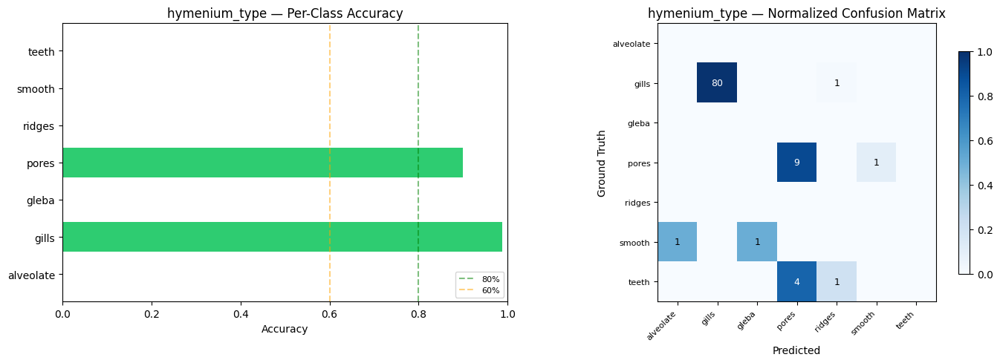

In [5]:
def plot_feature_eval(eval_result, feat_name, cmap="Blues"):
    """Confusion matrix heatmap + per-class accuracy bar chart."""
    y_true, y_pred, classes = eval_result["y_true"], eval_result["y_pred"], eval_result["classes"]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Per-class accuracy bar chart
    ax = axes[0]
    per_class_acc = []
    for cls in classes:
        cls_mask = [t == cls for t in y_true]
        n = sum(cls_mask)
        if n == 0:
            per_class_acc.append(0)
            continue
        correct = sum(t == p for t, p, m in zip(y_true, y_pred, cls_mask) if m)
        per_class_acc.append(correct / n)

    colors = ["#2ecc71" if a >= 0.8 else "#f39c12" if a >= 0.6 else "#e74c3c" for a in per_class_acc]
    ax.barh(classes, per_class_acc, color=colors)
    ax.set_xlim(0, 1)
    ax.set_xlabel("Accuracy")
    ax.set_title(f"{feat_name} — Per-Class Accuracy")
    ax.axvline(0.8, color="green", linestyle="--", alpha=0.5, label="80%")
    ax.axvline(0.6, color="orange", linestyle="--", alpha=0.5, label="60%")
    ax.legend(loc="lower right", fontsize=8)

    # Confusion matrix
    ax = axes[1]
    cm = confusion_matrix(y_true, y_pred, labels=classes)
    row_sums = cm.sum(axis=1, keepdims=True)
    cm_norm = np.divide(cm.astype(float), row_sums, where=row_sums > 0, out=np.zeros_like(cm, dtype=float))

    im = ax.imshow(cm_norm, cmap=cmap, vmin=0, vmax=1)
    ax.set_xticks(range(len(classes)))
    ax.set_yticks(range(len(classes)))
    ax.set_xticklabels(classes, rotation=45, ha="right", fontsize=8)
    ax.set_yticklabels(classes, fontsize=8)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Ground Truth")
    ax.set_title(f"{feat_name} — Normalized Confusion Matrix")

    for i in range(len(classes)):
        for j in range(len(classes)):
            if cm[i, j] > 0:
                ax.text(j, i, f"{cm[i, j]}", ha="center", va="center",
                        color="white" if cm_norm[i, j] > 0.5 else "black", fontsize=9)

    fig.colorbar(im, ax=ax, shrink=0.8)
    plt.tight_layout()
    plt.show()

plot_feature_eval(hy_eval, "hymenium_type", cmap="Blues")

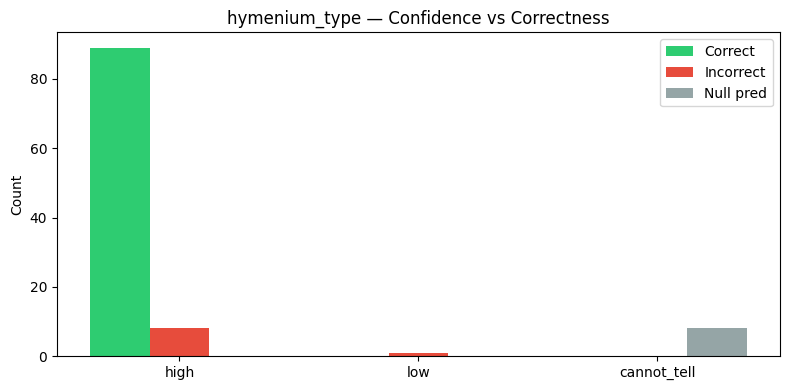

In [6]:
# Confidence distribution
def plot_confidence(feat, sidecars_dict, labels_dict, preds_dict):
    """Bar chart: confidence level x correct/incorrect."""
    conf_correct = Counter()
    conf_incorrect = Counter()
    conf_null = Counter()
    field = feature_fields[feat]

    for iid, data in sidecars_dict.items():
        conf = data.get("confidence", "unknown")
        pred = data.get(field)
        label = labels_dict.get(iid)

        if pred is None:
            conf_null[conf] += 1
        elif label is None:
            continue
        elif pred == label:
            conf_correct[conf] += 1
        else:
            conf_incorrect[conf] += 1

    levels = ["high", "low", "cannot_tell"]
    correct_vals = [conf_correct.get(l, 0) for l in levels]
    incorrect_vals = [conf_incorrect.get(l, 0) for l in levels]
    null_vals = [conf_null.get(l, 0) for l in levels]

    fig, ax = plt.subplots(figsize=(8, 4))
    x = np.arange(len(levels))
    w = 0.25
    ax.bar(x - w, correct_vals, w, label="Correct", color="#2ecc71")
    ax.bar(x, incorrect_vals, w, label="Incorrect", color="#e74c3c")
    ax.bar(x + w, null_vals, w, label="Null pred", color="#95a5a6")
    ax.set_xticks(x)
    ax.set_xticklabels(levels)
    ax.set_ylabel("Count")
    ax.set_title(f"{feat} — Confidence vs Correctness")
    ax.legend()
    plt.tight_layout()
    plt.show()

plot_confidence("hymenium_type", sidecars["hymenium_type"],
                image_labels["hymenium_type"], preds["hymenium_type"])

## cap_color Evaluation

In [7]:
cc_eval = evaluate_feature(
    "cap_color", preds["cap_color"],
    image_labels["cap_color"], manifest, gt["cap_color"]
)


cap_color — L1 per-image accuracy: 59.8% (61/102)
  null/cannot_tell predictions: 4
              precision    recall  f1-score   support

       brown       0.50      0.75      0.60        28
       cream       0.00      0.00      0.00         6
        grey       0.50      0.33      0.40         3
      orange       0.40      0.29      0.33         7
         red       1.00      0.33      0.50         6
       white       0.75      0.77      0.76        39
      yellow       0.45      0.38      0.42        13

    accuracy                           0.60       102
   macro avg       0.51      0.41      0.43       102
weighted avg       0.58      0.60      0.57       102

L2 species consensus: 61.5% (16/26 species)


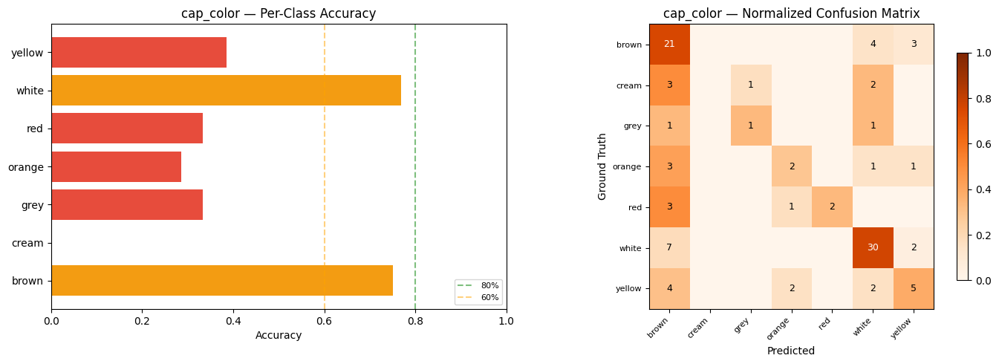

In [8]:
plot_feature_eval(cc_eval, "cap_color", cmap="Oranges")

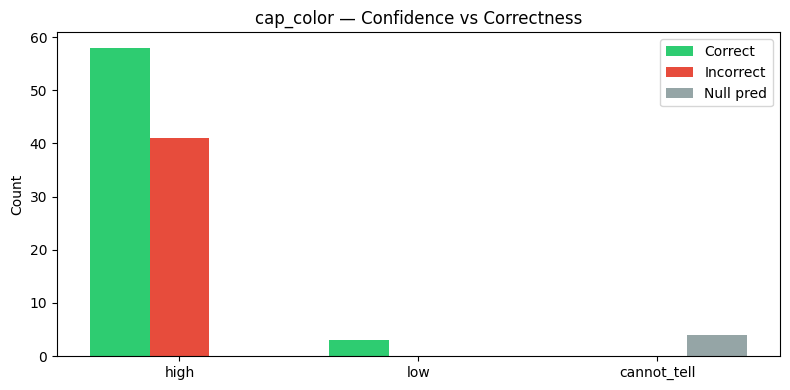

In [9]:
plot_confidence("cap_color", sidecars["cap_color"],
                image_labels["cap_color"], preds["cap_color"])

## cap_color — Multi-Label Corrected Evaluation

The strict eval above compares VLM prediction against `features_json["cap"]["colors"][0]` — a single
species-canonical color. This is **too strict** because:
- A species may have 5-10+ valid cap colors (e.g., *Fomitopsis pinicola* has 8)
- `colors[0]` depends on LLM extraction order from text, not importance
- Image-level color depends on specimen age, lighting, moisture

**Corrected eval:** Accept prediction as correct if it matches **any** of the species' canonical colors
(after alias resolution to the 12-color canonical palette).

In [10]:
# Multi-label corrected evaluation for cap_color
def evaluate_multilabel(preds_dict, manifest_df, gt_ml, gt_single):
    """Compare strict (single-label) vs corrected (multi-label) accuracy."""
    strict_correct, ml_correct, total, null_count = 0, 0, 0, 0
    error_analysis = []  # track what changed

    for iid, pred in preds_dict.items():
        sp = manifest_df.loc[manifest_df["image_id"] == iid, "species"]
        if sp.empty:
            continue
        sp = sp.iloc[0]

        strict_label = gt_single.get(sp)
        ml_labels = gt_ml.get(sp, set())

        if strict_label is None:
            continue
        if pred is None:
            null_count += 1
            continue

        total += 1
        strict_match = pred == strict_label
        ml_match = pred in ml_labels

        if strict_match:
            strict_correct += 1
        if ml_match:
            ml_correct += 1

        if ml_match and not strict_match:
            error_analysis.append({
                "image_id": iid, "species": sp, "pred": pred,
                "strict_gt": strict_label, "ml_gt": ml_labels,
            })

    strict_acc = strict_correct / total if total else 0
    ml_acc = ml_correct / total if total else 0

    print(f"Strict (colors[0]) accuracy:  {strict_acc:.1%} ({strict_correct}/{total})")
    print(f"Multi-label (any match) acc:   {ml_acc:.1%} ({ml_correct}/{total})")
    print(f"Gain from multi-label:         +{ml_acc - strict_acc:.1%} ({ml_correct - strict_correct} images)")
    print(f"Null predictions:              {null_count}")

    if error_analysis:
        print(f"\nImages rescued by multi-label GT ({len(error_analysis)}):")
        for e in error_analysis[:15]:
            print(f"  {e['species']:35s} pred={e['pred']:8s} strict_gt={e['strict_gt']:8s} "
                  f"ml_gt={e['ml_gt']}")

    return {"strict_acc": strict_acc, "ml_acc": ml_acc, "total": total,
            "rescued": error_analysis}

ml_result = evaluate_multilabel(
    preds["cap_color"], manifest, gt_multilabel, gt["cap_color"]
)

Strict (colors[0]) accuracy:  59.8% (61/102)
Multi-label (any match) acc:   74.5% (76/102)
Gain from multi-label:         +14.7% (15 images)
Null predictions:              4

Images rescued by multi-label GT (15):
  Amanita parcivolvata                pred=orange   strict_gt=red      ml_gt={'red', 'orange'}
  Boletus betulicola                  pred=brown    strict_gt=grey     ml_gt={'grey', 'brown'}
  Cortinarius vibratilis              pred=orange   strict_gt=yellow   ml_gt={'orange', 'yellow'}
  Fomitopsis pinicola                 pred=brown    strict_gt=orange   ml_gt={'white', 'black', 'brown', 'grey', 'yellow', 'red', 'orange'}
  Cortinarius vibratilis              pred=orange   strict_gt=yellow   ml_gt={'orange', 'yellow'}
  Fomitopsis pinicola                 pred=white    strict_gt=orange   ml_gt={'white', 'black', 'brown', 'grey', 'yellow', 'red', 'orange'}
  Hygrophorus chrysodon               pred=yellow   strict_gt=white    ml_gt={'white', 'orange', 'yellow'}
  Hygrophorus

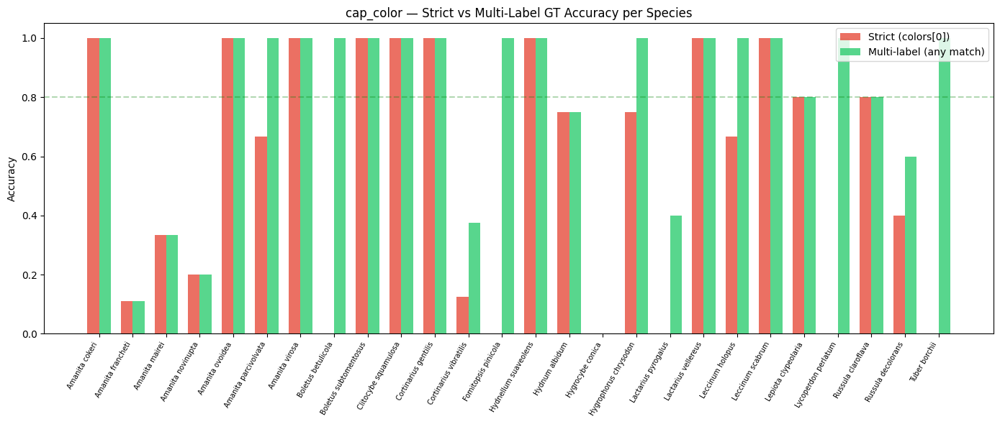


Species                             Imgs  Strict Multi-L GT colors  GT labels
-----------------------------------------------------------------------------------------------
Amanita cokeri                         2    100%    100%    1   white
Amanita francheti                      9     11%     11%    1   brown
Amanita mairei                         3     33%     33%    1   grey
Amanita novinupta                      5     20%     20%    2   pink, white
Amanita ovoidea                        6    100%    100%    1   white
Amanita parcivolvata                   3     67%    100%    2   orange, red
Amanita virosa                         3    100%    100%    3   pink, white, yellow
Boletus betulicola                     1      0%    100%    2   brown, grey
Boletus subtomentosus                  2    100%    100%    3   brown, olive, yellow
Clitocybe squamulosa                   4    100%    100%    2   brown, orange
Cortinarius gentilis                   8    100%    100%    1   brown
C

In [11]:
# Per-species multi-label GT coverage and accuracy
def species_multilabel_breakdown(preds_dict, manifest_df, gt_ml, gt_single):
    """Show per-species accuracy with strict vs multi-label GT."""
    species_data = []
    for sp in sorted(manifest_df["species"].unique()):
        sp_imgs = manifest_df[manifest_df["species"] == sp]["image_id"].tolist()
        strict_gt = gt_single.get(sp)
        ml_gt = gt_ml.get(sp, set())

        n_total = len(sp_imgs)
        n_strict_correct = 0
        n_ml_correct = 0
        pred_counts = Counter()

        for iid in sp_imgs:
            pred = preds_dict.get(iid)
            if pred is None:
                continue
            pred_counts[pred] += 1
            if strict_gt and pred == strict_gt:
                n_strict_correct += 1
            if pred in ml_gt:
                n_ml_correct += 1

        species_data.append({
            "species": sp,
            "n_images": n_total,
            "strict_gt": strict_gt,
            "ml_gt": ", ".join(sorted(ml_gt)) if ml_gt else "—",
            "n_gt_colors": len(ml_gt),
            "strict_acc": n_strict_correct / n_total if n_total else 0,
            "ml_acc": n_ml_correct / n_total if n_total else 0,
            "pred_dist": dict(pred_counts),
        })

    df = pd.DataFrame(species_data)

    # Bar chart: strict vs multi-label accuracy per species
    fig, ax = plt.subplots(figsize=(14, 6))
    x = np.arange(len(df))
    w = 0.35
    ax.bar(x - w/2, df["strict_acc"], w, label="Strict (colors[0])", color="#e74c3c", alpha=0.8)
    ax.bar(x + w/2, df["ml_acc"], w, label="Multi-label (any match)", color="#2ecc71", alpha=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(df["species"], rotation=60, ha="right", fontsize=7)
    ax.set_ylim(0, 1.05)
    ax.set_ylabel("Accuracy")
    ax.set_title("cap_color — Strict vs Multi-Label GT Accuracy per Species")
    ax.legend()
    ax.axhline(0.8, color="green", linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Print table
    print(f"\n{'Species':35s} {'Imgs':>4s} {'Strict':>7s} {'Multi-L':>7s} {'GT colors':>4s}  GT labels")
    print("-" * 95)
    for _, row in df.iterrows():
        print(f"{row['species']:35s} {row['n_images']:4d} {row['strict_acc']:7.0%} "
              f"{row['ml_acc']:7.0%} {row['n_gt_colors']:4d}   {row['ml_gt']}")

    return df

sp_breakdown = species_multilabel_breakdown(
    preds["cap_color"], manifest, gt_multilabel, gt["cap_color"]
)

## Baseline Comparison — Per-Feature VLM vs All-at-Once VLM

Load predictions from the monolithic VLM run (`data/vlm_full/run_001/`) and compare accuracy.

In [12]:
# Load all-at-once VLM predictions
vlm_full_field = {"hymenium_type": "hymenium_type", "cap_color": "cap_color_primary"}
vlm_full_preds = {}

for feat in FEATURES:
    field = vlm_full_field[feat]
    vlm_full_preds[feat] = {}
    for _, row in manifest.iterrows():
        iid = row["image_id"]
        sidecar = VLM_FULL_DIR / f"{iid}.json"
        if not sidecar.exists():
            continue
        try:
            data = json.loads(sidecar.read_text())
            vlm_full_preds[feat][iid] = data.get(field)
        except (json.JSONDecodeError, KeyError):
            continue
    print(f"{feat}: {len(vlm_full_preds[feat])} all-at-once predictions")

# For cap_color, resolve free-text aliases to canonical palette
if vlm_full_preds.get("cap_color"):
    from ingestion.normalize import load_vocabulary
    from vision.labeling.vlm_feature_schemas import _CLASSES

    vocab = load_vocabulary()
    color_aliases = vocab.get("color_palette", {}).get("aliases", {})
    canonical_colors = set(_CLASSES["cap_color"])

    resolved = {}
    for iid, val in vlm_full_preds["cap_color"].items():
        if val is None:
            resolved[iid] = None
        elif val.lower() in canonical_colors:
            resolved[iid] = val.lower()
        elif val.lower() in color_aliases:
            resolved[iid] = color_aliases[val.lower()]
        else:
            resolved[iid] = None
    vlm_full_preds["cap_color"] = resolved
    n_resolved = sum(1 for v in resolved.values() if v is not None)
    print(f"  cap_color alias resolution: {n_resolved}/{len(resolved)} mapped to canonical")

hymenium_type: 106 all-at-once predictions
cap_color: 106 all-at-once predictions
  cap_color alias resolution: 74/106 mapped to canonical



hymenium_type — Method Comparison:
method   All-at-once VLM  Per-feature VLM
class                                    
OVERALL            88.3%            90.8%
gills              97.3%            98.8%
pores              78.6%            90.0%
smooth              0.0%             0.0%
teeth               0.0%             0.0%


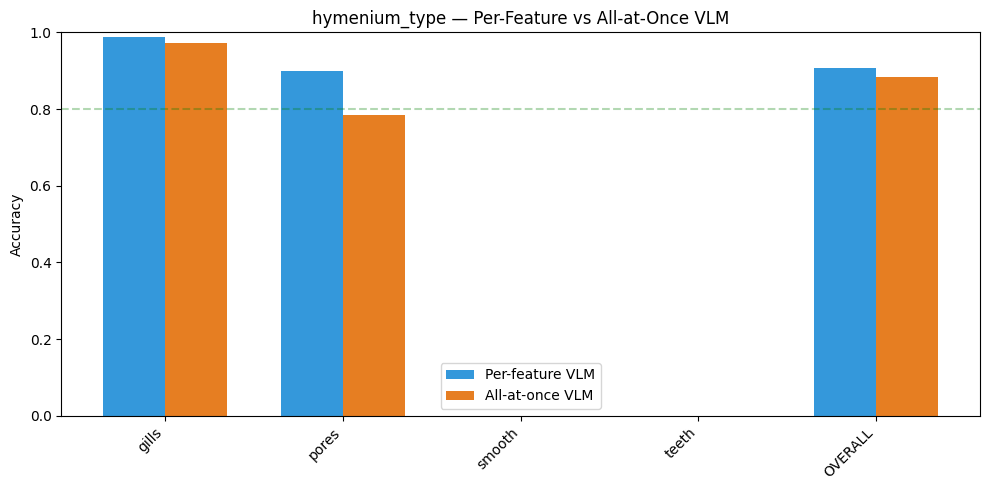


cap_color — Method Comparison:
method   All-at-once VLM  Per-feature VLM
class                                    
OVERALL            51.4%            59.8%
brown              53.8%            75.0%
cream               0.0%             0.0%
grey               33.3%            33.3%
orange              0.0%            28.6%
red                40.0%            33.3%
white              67.7%            76.9%
yellow              0.0%            38.5%


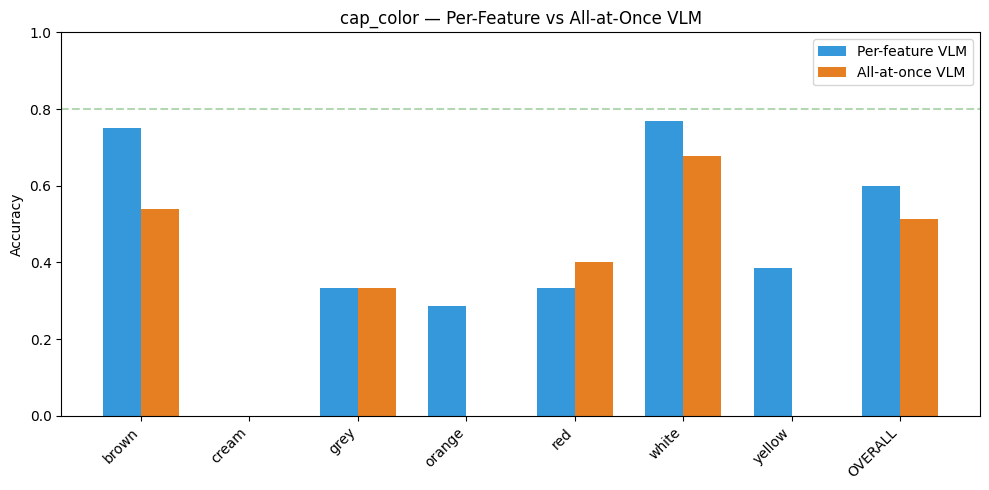

In [13]:
# Side-by-side comparison
def compare_methods(feat, per_feat_preds, all_at_once_preds, labels_dict):
    """Compute per-class accuracy for both methods and show comparison."""
    # Get shared images where both methods have predictions and labels exist
    methods = {"Per-feature VLM": per_feat_preds, "All-at-once VLM": all_at_once_preds}

    rows = []
    for method_name, method_preds in methods.items():
        y_true, y_pred = [], []
        for iid, pred in method_preds.items():
            label = labels_dict.get(iid)
            if label is None or pred is None:
                continue
            y_true.append(label)
            y_pred.append(pred)

        classes = sorted(set(y_true + y_pred))
        correct = sum(t == p for t, p in zip(y_true, y_pred))
        total = len(y_true)
        overall = correct / total if total else 0

        for cls in classes:
            cls_true = [t == cls for t in y_true]
            n = sum(cls_true)
            if n == 0:
                continue
            cls_correct = sum(t == p for t, p, m in zip(y_true, y_pred, cls_true) if m)
            rows.append({"method": method_name, "class": cls, "accuracy": cls_correct / n, "n": n})

        rows.append({"method": method_name, "class": "OVERALL", "accuracy": overall, "n": total})

    df = pd.DataFrame(rows)

    # Pivot for display
    pivot = df.pivot(index="class", columns="method", values="accuracy")
    print(f"\n{feat} — Method Comparison:")
    print(pivot.to_string(float_format=lambda x: f"{x:.1%}"))

    # Bar chart
    per_feat_df = df[df["method"] == "Per-feature VLM"].set_index("class")
    all_at_once_df = df[df["method"] == "All-at-once VLM"].set_index("class")
    all_classes = [c for c in per_feat_df.index if c != "OVERALL"] + ["OVERALL"]

    fig, ax = plt.subplots(figsize=(10, 5))
    x = np.arange(len(all_classes))
    w = 0.35
    ax.bar(x - w/2,
           [per_feat_df.loc[c, "accuracy"] if c in per_feat_df.index else 0 for c in all_classes],
           w, label="Per-feature VLM", color="#3498db")
    ax.bar(x + w/2,
           [all_at_once_df.loc[c, "accuracy"] if c in all_at_once_df.index else 0 for c in all_classes],
           w, label="All-at-once VLM", color="#e67e22")
    ax.set_xticks(x)
    ax.set_xticklabels(all_classes, rotation=45, ha="right")
    ax.set_ylim(0, 1)
    ax.set_ylabel("Accuracy")
    ax.set_title(f"{feat} — Per-Feature vs All-at-Once VLM")
    ax.legend()
    ax.axhline(0.8, color="green", linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()

for feat in FEATURES:
    compare_methods(feat, preds[feat], vlm_full_preds[feat], image_labels[feat])

## QA Examples — Images + VLM Reasoning

Show sample images with the VLM's describe-then-classify chain for visual QA:
- **Correct (high confidence)** — the chain working well
- **Misclassifications** — where the VLM reasoning went wrong
- **cannot_tell** — cases where the VLM correctly abstained

In [14]:
def show_qa_grid(image_ids, feat, sidecars_dict, labels_dict, title, max_cols=4, max_items=12):
    """Show image grid with VLM reasoning chain below each image."""
    field = feature_fields[feat]
    items = image_ids[:max_items]
    if not items:
        print(f"  No examples for: {title}")
        return

    n = len(items)
    ncols = min(max_cols, n)
    nrows = (n + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 5 * nrows))
    if nrows == 1 and ncols == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes)

    for idx, iid in enumerate(items):
        row, col = divmod(idx, ncols)
        ax = axes[row, col]

        # Load image
        img_path = PROCESSED_DIR / f"{iid}.jpg"
        if img_path.exists():
            img = Image.open(img_path)
            ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])

        # Build title with color coding
        data = sidecars_dict.get(iid, {})
        pred = data.get(field)
        label = labels_dict.get(iid)
        conf = data.get("confidence", "?")

        if pred is not None and pred == label:
            color = "green"
        elif pred is None:
            color = "grey"
        else:
            color = "red"

        ax.set_title(f"pred={pred}\nGT={label} [{conf}]", fontsize=8, color=color)

        # Add reasoning text below
        desc = data.get("visual_description", "")
        reasoning = data.get("reasoning", "")
        text = f"{desc[:80]}...\n{reasoning[:80]}..." if desc else ""
        ax.text(0.5, -0.15, text, transform=ax.transAxes, fontsize=6,
                ha="center", va="top", wrap=True)

    # Hide unused axes
    for idx in range(n, nrows * ncols):
        row, col = divmod(idx, ncols)
        axes[row, col].set_visible(False)

    fig.suptitle(f"{feat} — {title}", fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()


def qa_examples(feat, preds_dict, sidecars_dict, labels_dict):
    """Show QA grids for correct, incorrect, and cannot_tell."""
    field = feature_fields[feat]

    correct_high, incorrect, cannot_tell = [], [], []

    for iid, data in sidecars_dict.items():
        pred = data.get(field)
        label = labels_dict.get(iid)
        conf = data.get("confidence")

        if pred is None or conf == "cannot_tell":
            cannot_tell.append(iid)
        elif label is not None and pred == label and conf == "high":
            correct_high.append(iid)
        elif label is not None and pred != label:
            incorrect.append(iid)

    show_qa_grid(correct_high, feat, sidecars_dict, labels_dict,
                 "Correct (high confidence)", max_items=12)
    show_qa_grid(incorrect, feat, sidecars_dict, labels_dict,
                 "Misclassifications", max_items=16)
    show_qa_grid(cannot_tell, feat, sidecars_dict, labels_dict,
                 "cannot_tell / abstained", max_items=8)

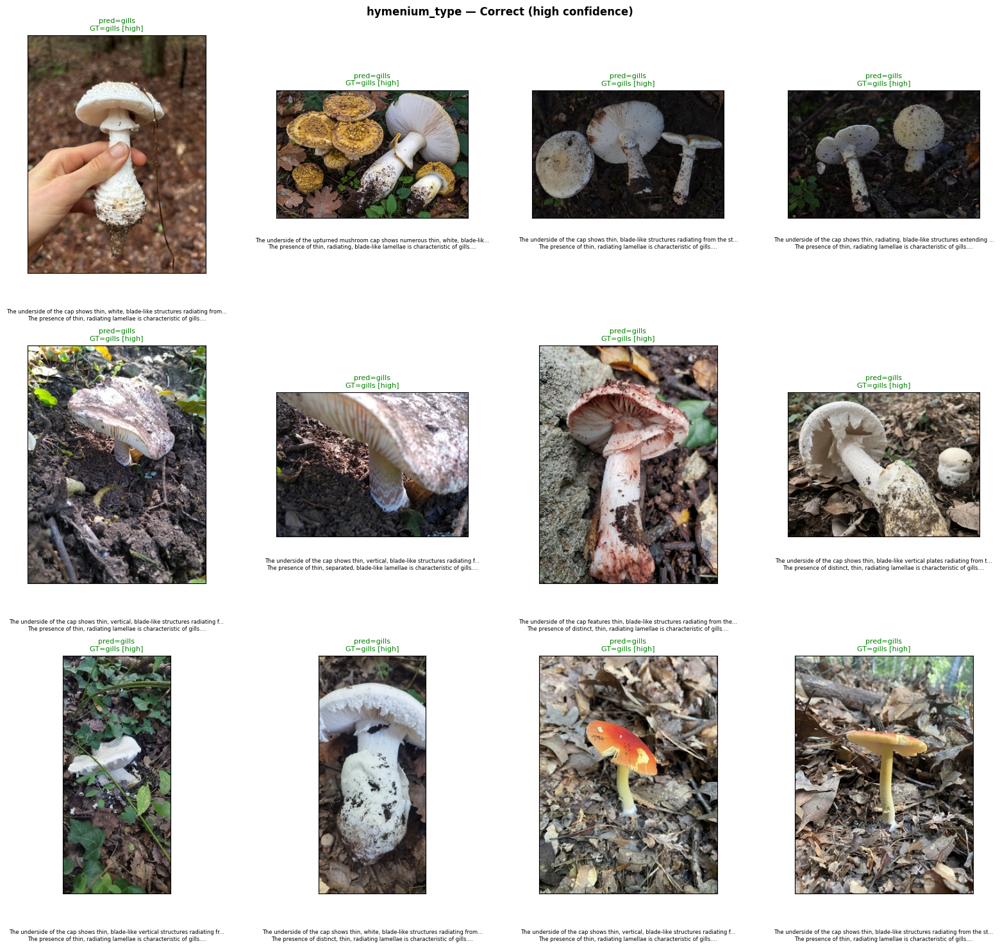

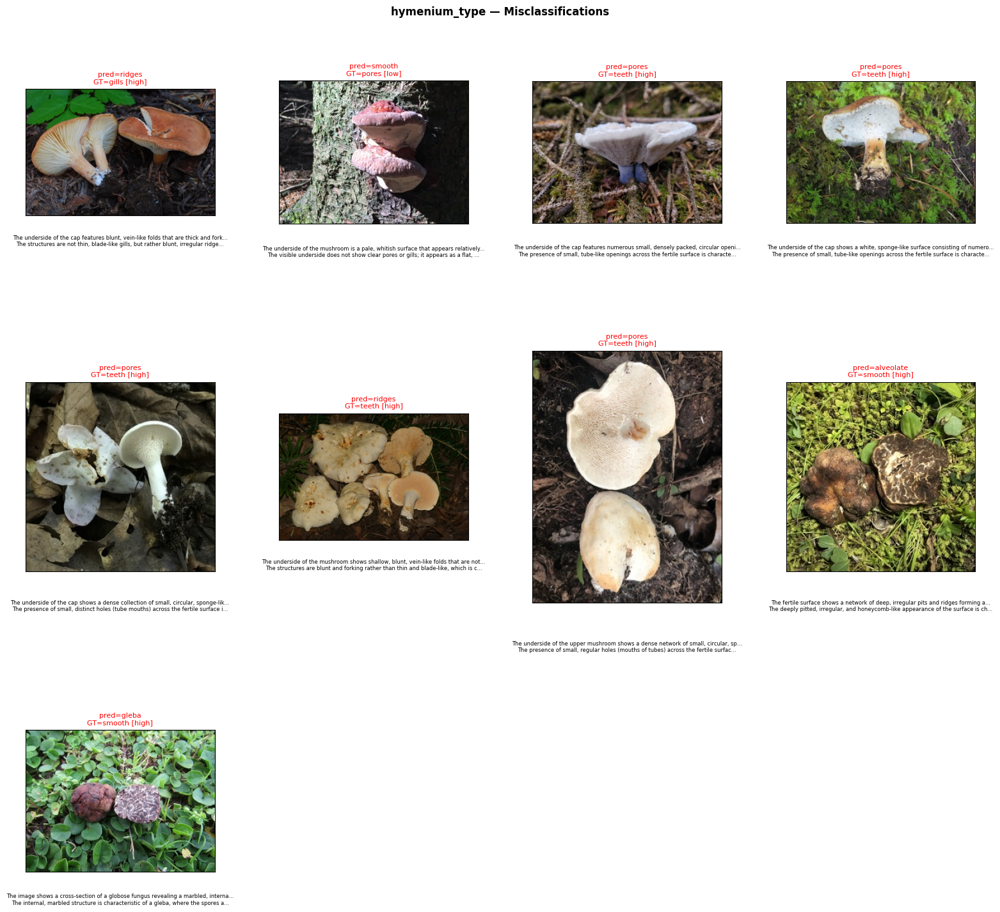

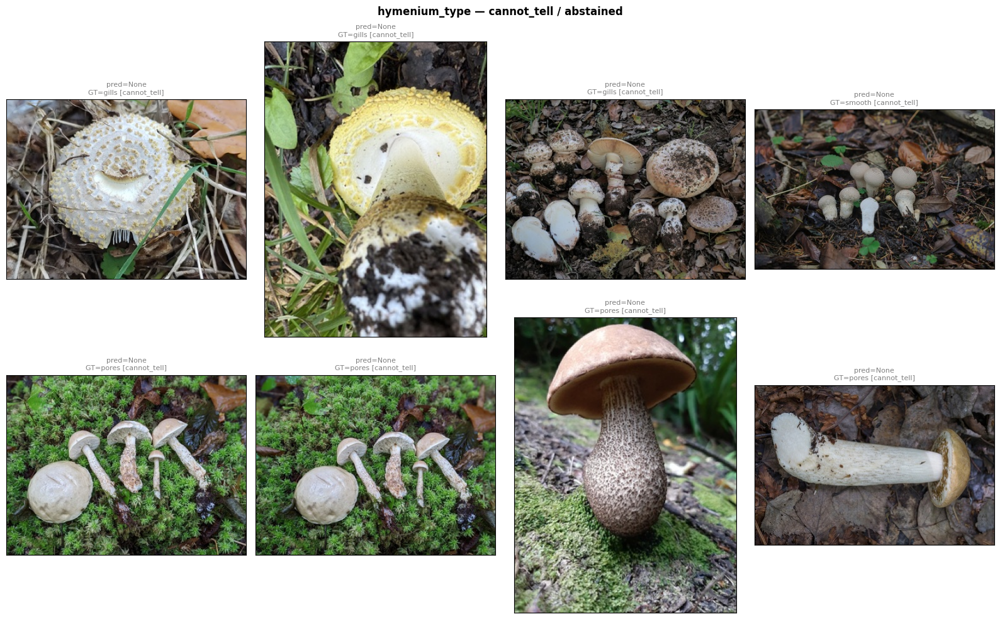

In [15]:
qa_examples("hymenium_type", preds["hymenium_type"],
            sidecars["hymenium_type"], image_labels["hymenium_type"])

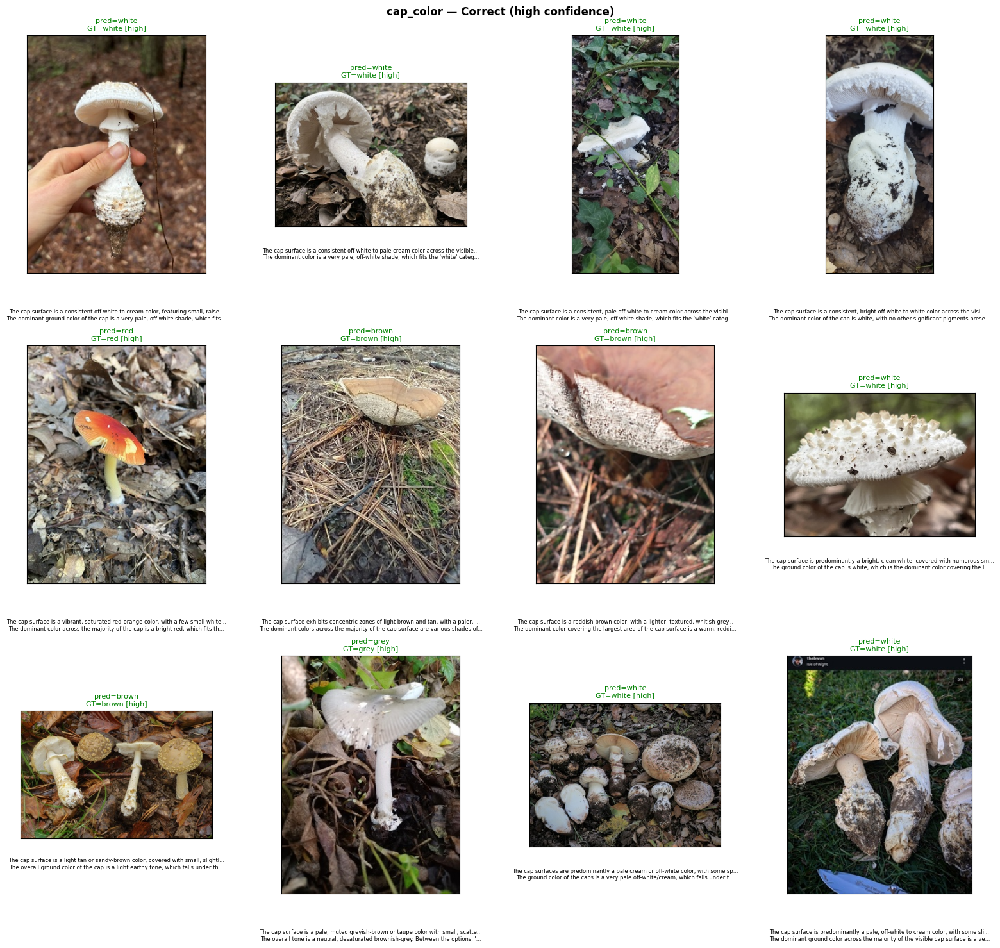

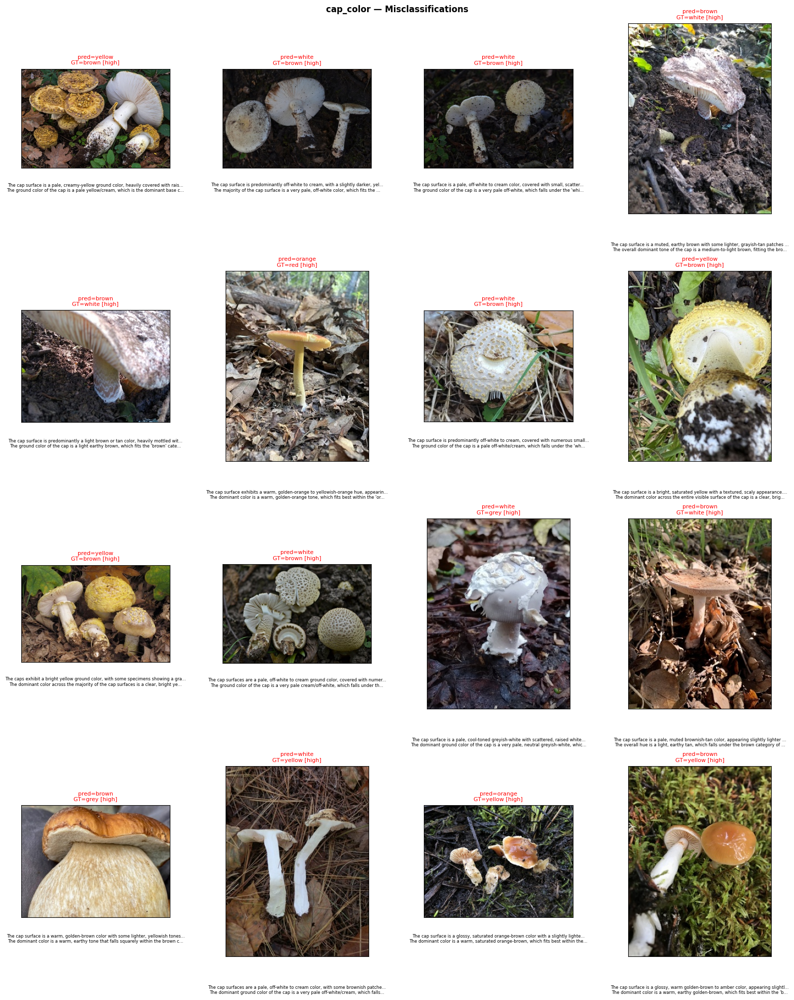

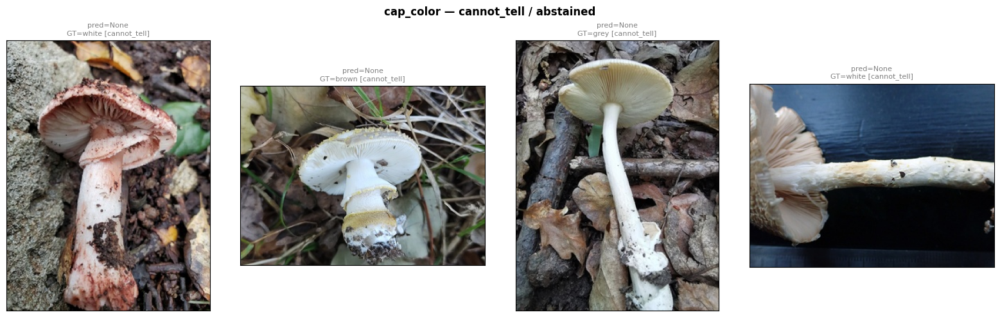

In [16]:
qa_examples("cap_color", preds["cap_color"],
            sidecars["cap_color"], image_labels["cap_color"])

## Manual QA Correlation (hymenium_type)

Cross-reference VLM `cannot_tell` predictions against human verdicts from manual QA.

In [17]:
# Load manual QA verdicts
qa_path = PROJECT_ROOT / "data" / "manual_qa" / "hymenium_type.jsonl"
if qa_path.exists():
    qa_verdicts = {}
    with open(qa_path) as f:
        for line in f:
            entry = json.loads(line)
            qa_verdicts[entry["image_id"]] = entry["verdict"]

    print(f"Manual QA verdicts: {len(qa_verdicts)}")
    print(f"  good: {sum(1 for v in qa_verdicts.values() if v == 'good')}")
    print(f"  bad: {sum(1 for v in qa_verdicts.values() if v == 'bad')}")

    # Cross-reference with eval images
    classified, abstained = 0, 0
    matrix = {"classified_good": 0, "classified_bad": 0,
              "abstained_good": 0, "abstained_bad": 0}

    for iid in manifest["image_id"]:
        verdict = qa_verdicts.get(iid)
        if verdict is None:
            continue
        data = sidecars["hymenium_type"].get(iid, {})
        pred = data.get("hymenium_type")
        conf = data.get("confidence")

        is_abstained = pred is None or conf == "cannot_tell"
        key = f"{'abstained' if is_abstained else 'classified'}_{verdict}"
        matrix[key] += 1

    print("\nVLM vs Human QA (hymenium_type):")
    print(f"                   Human: good   Human: bad")
    print(f"  VLM classified:  {matrix['classified_good']:>5d}         {matrix['classified_bad']:>5d}")
    print(f"  VLM abstained:   {matrix['abstained_good']:>5d}         {matrix['abstained_bad']:>5d}")

    total_qa = sum(matrix.values())
    if total_qa > 0:
        agree = matrix["classified_good"] + matrix["abstained_bad"]
        print(f"\n  Agreement rate: {agree/total_qa:.1%} ({agree}/{total_qa})")
else:
    print("No manual QA file found at:", qa_path)

Manual QA verdicts: 2622
  good: 2038
  bad: 584

VLM vs Human QA (hymenium_type):
                   Human: good   Human: bad
  VLM classified:     72             0
  VLM abstained:       3             0

  Agreement rate: 96.0% (72/75)


## Summary

In [18]:
# Summary table
from sklearn.metrics import f1_score

summary_rows = []
for feat, ev in [("hymenium_type", hy_eval), ("cap_color", cc_eval)]:
    macro_f1 = f1_score(ev["y_true"], ev["y_pred"], average="macro", zero_division=0)
    weighted_f1 = f1_score(ev["y_true"], ev["y_pred"], average="weighted", zero_division=0)
    row = {
        "Feature": feat,
        "L1 Accuracy": f"{ev["l1_acc"]:.1%}",
        "Macro F1": f"{macro_f1:.3f}",
        "Weighted F1": f"{weighted_f1:.3f}",
        "L2 Consensus": f"{ev["l2_acc"]:.1%}",
        "Null/Abstained": ev["null_count"],
        "N Images": len(ev["y_true"]),
    }
    # Add multi-label accuracy for cap_color
    if feat == "cap_color":
        row["ML Accuracy"] = f"{ml_result["ml_acc"]:.1%}"
        row["ML Gain"] = f"+{ml_result["ml_acc"] - ev["l1_acc"]:.1%}"
    else:
        row["ML Accuracy"] = "—"
        row["ML Gain"] = "—"
    summary_rows.append(row)

summary_df = pd.DataFrame(summary_rows)
print("Per-Feature VLM Evaluation Summary")
print("=" * 90)
print(summary_df.to_string(index=False))


Per-Feature VLM Evaluation Summary
      Feature L1 Accuracy Macro F1 Weighted F1 L2 Consensus  Null/Abstained  N Images ML Accuracy ML Gain
hymenium_type       90.8%    0.254       0.901        84.0%               8        98           —       —
    cap_color       59.8%    0.430       0.572        61.5%               4       102       74.5%  +14.7%
